In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
from evaluation.neuroprobe.config import ROOT_DIR, SAMPLING_RATE
from subject.braintreebank import BrainTreebankSubject
import pandas as pd
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from scipy.stats import pearsonr
from matplotlib.lines import Line2D
import torch
from model.BFModule import BFModule
import torch.nn as nn
import matplotlib.image as mpimg

SUBJECT_TRIAL_TO_MOVIE = {
    (1,0): 'fantastic-mr-fox.mp4',
    (1,1): 'the-martian.mp4',
    (1,2): 'thor-ragnarok.mp4',
    (2,0): 'venom.mp4',
    (2,1): 'spider-man-3-homecoming.mp4',
    (2,2): 'guardians-of-the-galaxy.mp4',
    (2,3): 'guardians-of-the-galaxy-2.mp4',
    (2,4): 'avengers-infinity-war.mp4',
    (2,5): 'black-panther.mp4',
    (2,6): 'aquaman.mp4',
    (3,0): 'cars-2.mp4',
    (3,1): 'lotr-1.mp4',
    (3,2): 'lotr-2.mp4',
    (4,0): 'shrek-the-third.mp4',
    (4,1): 'megamind.mp4',
    (4,2): 'incredibles.mp4',
    (5,0): 'fantastic-mr-fox.mp4',
    (6,0): 'megamind.mp4',
    (6,1): 'toy-story.mp4',
    (6,2): 'coraline.mp4',
    (7,0): 'cars-2.mp4',
    (7,1): 'megamind.mp4',
    (8,0): 'sesame-street-episode-3990.mp4',
    (9,0): 'ant-man.mp4',
    (10,0): 'cars-2.mp4',
    (10,1): 'spider-man-far-from-home.mp4',
}

CLIP_DIR = "/om2/data/public/braintreebank_movies_clip_preprocessed_2/"
MOVIES_DIR = "/om2/data/public/braintreebank_movies/"
REGR_DIR = "/om2/data/public/braintreebank_movies_clip_preprocessed_2/regr_results/"

In [2]:
def get_movie_data(movie):
    clip_features_path = os.path.join(CLIP_DIR, movie.replace('.mp4', '_clip_features.npy'))
    timestamps_path = os.path.join(CLIP_DIR, movie.replace('.mp4', '_timestamps.npy'))
    movie_path = os.path.join(MOVIES_DIR, movie)

    clip_features = np.load(clip_features_path)  # shape: (num_samples, feature_dim)
    timestamps = np.load(timestamps_path)
    return clip_features, timestamps, movie_path

def get_subject_trial_from_movie(movie):
    subject_trial_list = []
    for subject_trial, movie_name in SUBJECT_TRIAL_TO_MOVIE.items():
        if movie_name == movie:
            subject_trial_list.append(subject_trial)
    return subject_trial_list

In [3]:
movie = 'ant-man.mp4'
clip_features, timestamps, movie_path = get_movie_data(movie)
subject_trial_list = get_subject_trial_from_movie(movie)
subject_trial_list

[(9, 0)]

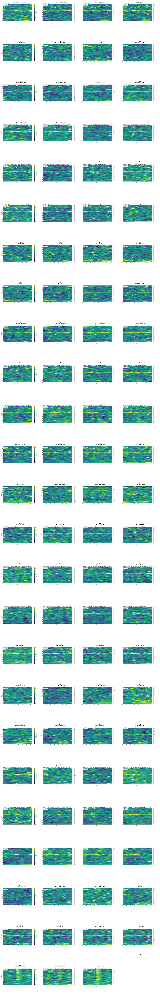

Top electrodes by correlation:
1. T1aI2: mean_corr=0.396
2. P2d12: mean_corr=0.385
3. P2b8: mean_corr=0.382
4. F3a3: mean_corr=0.374
5. P2d11: mean_corr=0.370
6. P1C6: mean_corr=0.368
7. P1C8: mean_corr=0.368
8. T1b3: mean_corr=0.368
9. T1aI5: mean_corr=0.367
10. P2c10: mean_corr=0.366


In [4]:
for subject_id, trial_id in subject_trial_list:

    subject = BrainTreebankSubject(subject_id, cache=False)
    electrode_locations = {electrode_label: subject.get_electrode_metadata(electrode_label)['DesikanKilliany'] for electrode_label in subject.get_electrode_labels()}
    unique_electrodes = list(electrode_locations.keys())

    save_dir = os.path.join(REGR_DIR, f"btbank{subject_id}", f"trial_{trial_id}")

    n_electrodes = len(unique_electrodes)
    n_cols = 4
    n_rows = (n_electrodes + n_cols - 1) // n_cols

    per_subplot_width = 6
    per_subplot_height = 6
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(per_subplot_width * n_cols, per_subplot_height * n_rows))
    axes = axes.flatten() if n_electrodes > 1 else [axes]

    electrode_scores = []
    for idx, electrode_label in enumerate(unique_electrodes):
        save_path = os.path.join(save_dir, f"{electrode_label}_test_correlation.png")
        corr_matrix_path = os.path.join(save_dir, f"{electrode_label}_test_correlation.npy")
        pval_matrix_path = os.path.join(save_dir, f"{electrode_label}_test_pval.npy")

        corr_matrix = np.load(corr_matrix_path)
        pval_matrix = np.load(pval_matrix_path)

        significant_mask = pval_matrix < 0.05
        # if np.any(significant_mask):
        #     mean_corr = np.mean(corr_matrix[significant_mask])
        # else:
        #     mean_corr = np.mean(corr_matrix)
        # electrode_scores.append((electrode_label, mean_corr))

        max_abs_corr = np.max(corr_matrix[significant_mask])
        electrode_scores.append((electrode_label, max_abs_corr))


        ax = axes[idx]
        img = mpimg.imread(save_path)
        ax.imshow(img)
        ax.axis('off')
        description = electrode_locations[electrode_label]
        ax.set_title(f"{electrode_label}\n{description}", fontsize=10)

    for j in range(idx+1, len(axes)):
        axes[j].axis('off')

    plt.title(f"btbank{subject_id}_{trial_id}")
    plt.tight_layout()
    plt.show()

    electrode_scores.sort(key=lambda x: x[1], reverse=True)

    print("Top electrodes by correlation:")
    for rank, (electrode_label, mean_corr) in enumerate(electrode_scores[:10], 1):
        print(f"{rank}. {electrode_label}: mean_corr={mean_corr:.3f}")

    # Optionally, select the best electrode(s) for further analysis/plotting
    best_electrodes = [electrode_scores[0][0]] if electrode_scores else []

In [5]:
def output_correlations(movie):
    subject_trial_list = get_subject_trial_from_movie(movie)

    for subject_id, trial_id in subject_trial_list:

        subject = BrainTreebankSubject(subject_id, cache=False)
        electrode_locations = {electrode_label: subject.get_electrode_metadata(electrode_label)['DesikanKilliany'] for electrode_label in subject.get_electrode_labels()}
        unique_electrodes = list(electrode_locations.keys())

        save_dir = os.path.join(REGR_DIR, f"btbank{subject_id}", f"trial_{trial_id}")

        n_electrodes = len(unique_electrodes)
        n_cols = 4
        n_rows = (n_electrodes + n_cols - 1) // n_cols

        per_subplot_width = 6
        per_subplot_height = 6
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(per_subplot_width * n_cols, per_subplot_height * n_rows))
        axes = axes.flatten() if n_electrodes > 1 else [axes]

        electrode_scores = []
        for idx, electrode_label in enumerate(unique_electrodes):
            save_path = os.path.join(save_dir, f"{electrode_label}_test_correlation.png")
            corr_matrix_path = os.path.join(save_dir, f"{electrode_label}_test_correlation.npy")
            pval_matrix_path = os.path.join(save_dir, f"{electrode_label}_test_pval.npy")

            corr_matrix = np.load(corr_matrix_path)
            pval_matrix = np.load(pval_matrix_path)

            significant_mask = pval_matrix < 0.05
            # if np.any(significant_mask):
            #     mean_corr = np.mean(corr_matrix[significant_mask])
            # else:
            #     mean_corr = np.mean(corr_matrix)
            # electrode_scores.append((electrode_label, mean_corr))

            max_abs_corr = np.max(corr_matrix[significant_mask])
            electrode_scores.append((electrode_label, max_abs_corr))


            ax = axes[idx]
            img = mpimg.imread(save_path)
            ax.imshow(img)
            ax.axis('off')
            description = electrode_locations[electrode_label]
            ax.set_title(f"{electrode_label}\n{description}", fontsize=10)

        for j in range(idx+1, len(axes)):
            axes[j].axis('off')

        plt.title(f"btbank{subject_id}_{trial_id}")
        plt.tight_layout()
        plt.show()

        electrode_scores.sort(key=lambda x: x[1], reverse=True)

        print("Top electrodes by correlation:")
        for rank, (electrode_label, mean_corr) in enumerate(electrode_scores[:10], 1):
            print(f"{rank}. {electrode_label}: mean_corr={mean_corr:.3f}")

        # Optionally, select the best electrode(s) for further analysis/plotting
        best_electrodes = [electrode_scores[0][0]] if electrode_scores else []

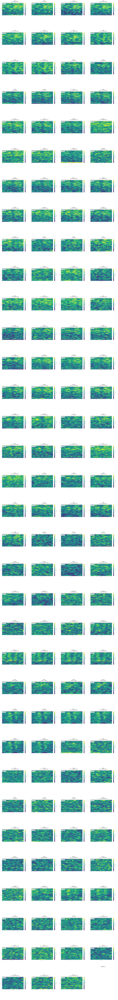

Top electrodes by correlation:
1. LT2aA14: mean_corr=0.382
2. LT3a2: mean_corr=0.363
3. LT2aA5: mean_corr=0.346
4. LT3bHa6: mean_corr=0.345
5. RT2aA10: mean_corr=0.345
6. LT3a3: mean_corr=0.345
7. LT2aA4: mean_corr=0.341
8. LT3a4: mean_corr=0.337
9. RT2aA9: mean_corr=0.337
10. LT2aA10: mean_corr=0.334


In [6]:
output_correlations('aquaman.mp4')